,0.112,0.494623656,0.37109375,-0.107579462
0,0.120,0.495601,0.365234,-0.110024
1,0.128,0.496579,0.375000,-0.114914
2,0.136,0.497556,0.380859,-0.117359
3,0.144,0.497556,0.371094,-0.119804
4,0.152,0.495601,0.394531,-0.122249
...,...,...,...,...
149981,1199.968,0.401760,0.515625,-0.168704
149982,1199.976,0.404692,0.494141,-0.171149
149983,1199.984,0.409580,0.494141,-0.171149
149984,1199.992,0.416422,0.529297,-0.171149


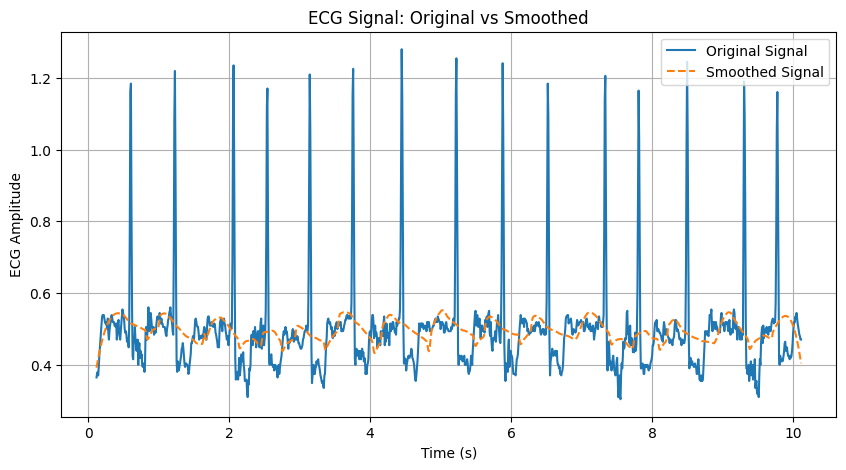

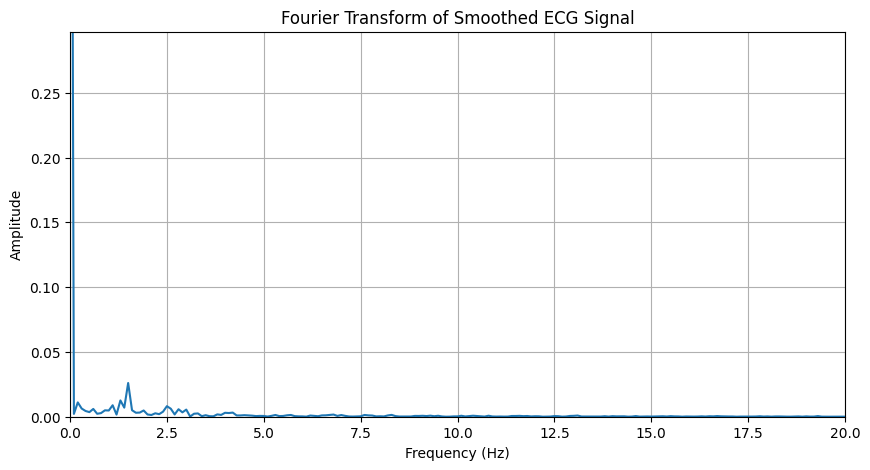

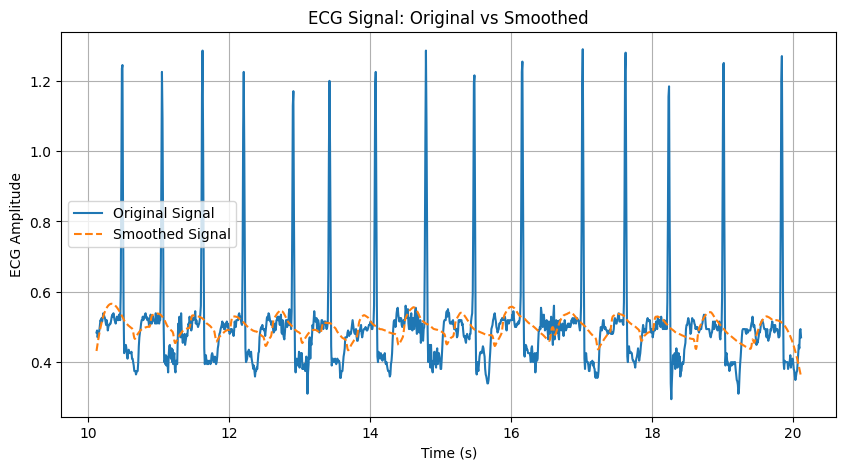

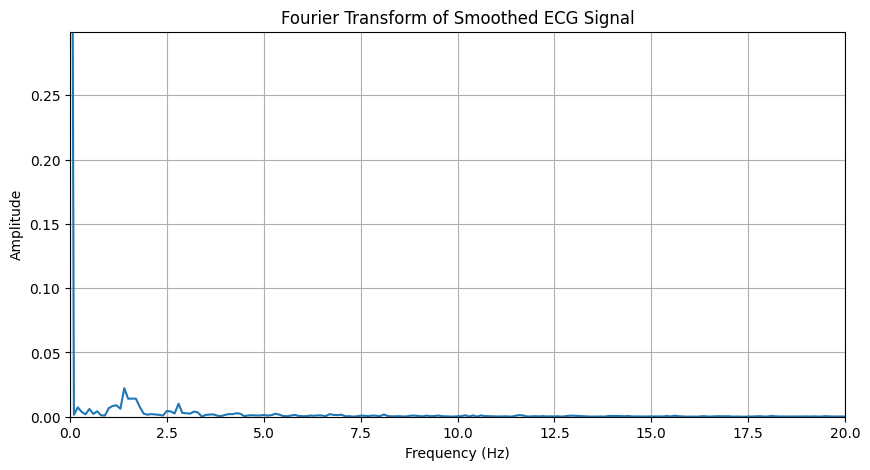

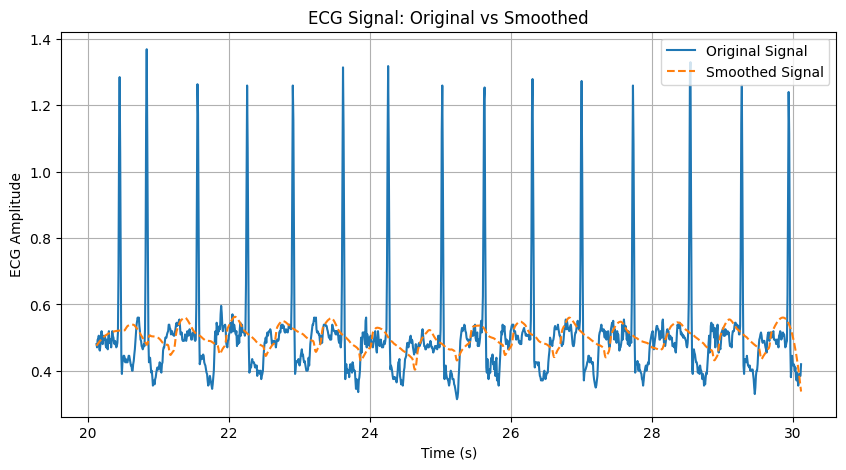

...

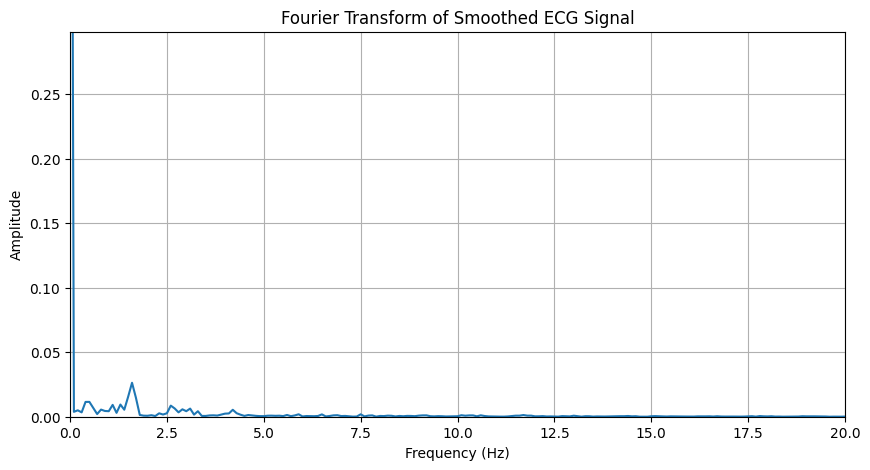

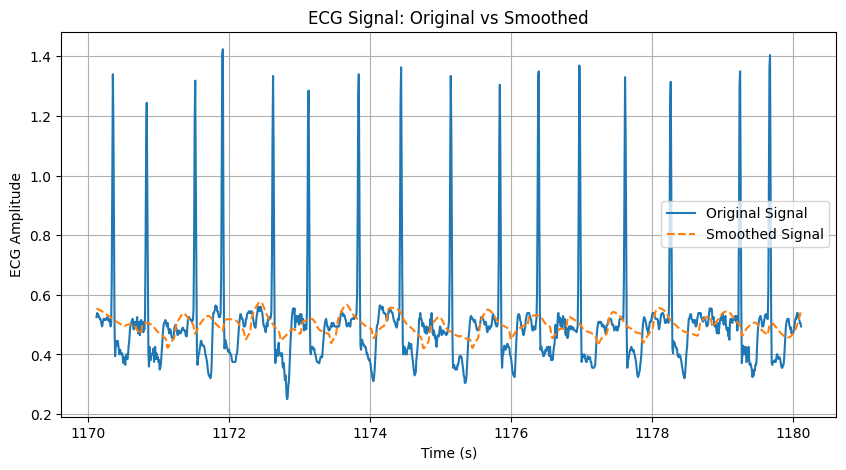

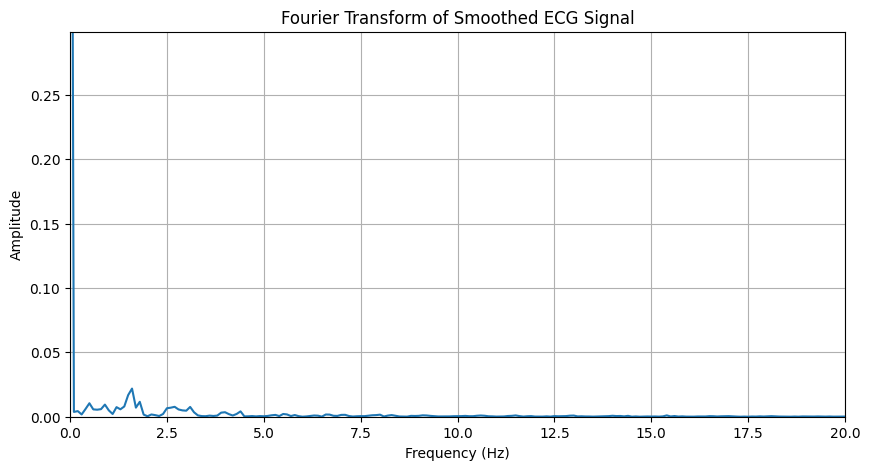

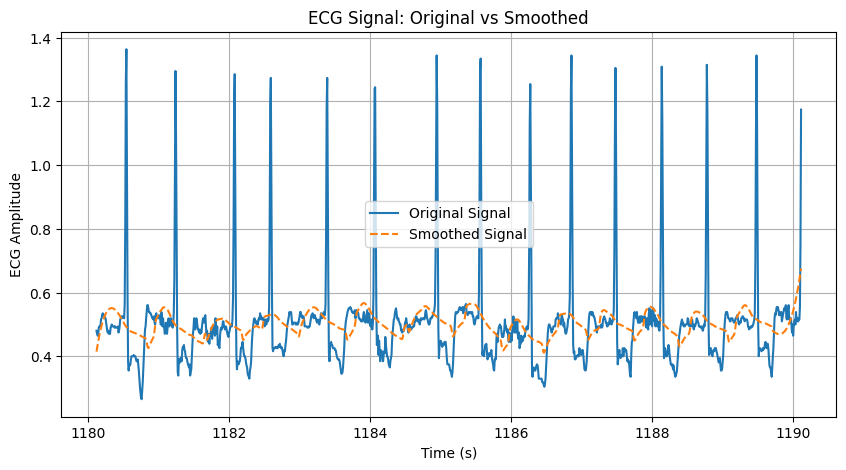

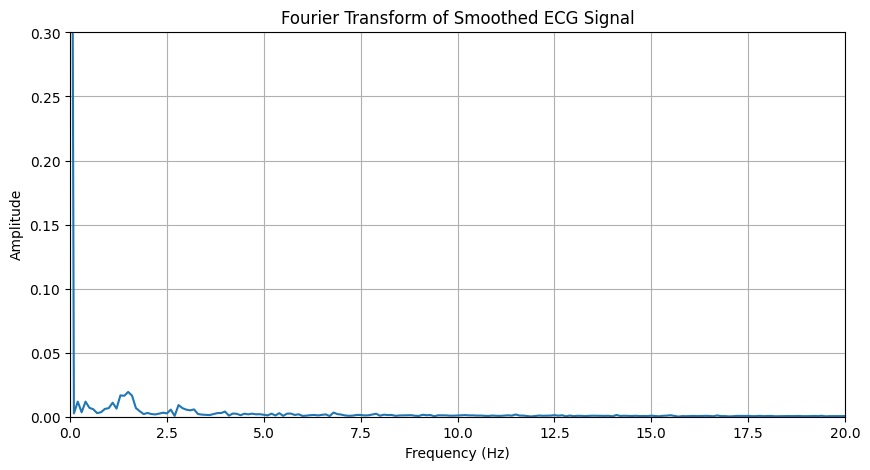

In [2]:
import pandas as pd
from scipy.fft import fft, fftfreq
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter  # For Savitzky-Golay smoothing

# Load the data
path = "data.csv"
fs = 125  # Sampling frequency
batch_duration=10*fs
df = pd.read_csv(path, sep=',', skiprows=15)
display(df)

# Trim the dataframe to the desired range
df.columns=['Timestamp','PPG','ECG','resp']
for i in range(int(np.floor(len(df.index)/batch_duration))):
    offset=batch_duration*i
    data = df['ECG'].iloc[offset:offset + batch_duration].values

    # Smooth the ECG signal using Savitzky-Golay filter
    smoothed_data = savgol_filter(data, window_length=101, polyorder=3)  # Adjust window length and polyorder as needed
    # Plot the original and smoothed signals
    plt.figure(figsize=(10, 5))
    plt.plot(df['Timestamp'].iloc[offset:offset + batch_duration], data, label='Original Signal')
    plt.plot(df['Timestamp'].iloc[offset:offset + batch_duration], smoothed_data, label='Smoothed Signal', linestyle='--')
    plt.title("ECG Signal: Original vs Smoothed")
    plt.xlabel('Time (s)')
    plt.ylabel('ECG Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Perform Fourier Transform
    N = len(smoothed_data)
    yf = fft(smoothed_data)
    yf = 2.0 / N * np.abs(yf[:N // 2])  # Normalize and keep only the positive frequencies
    xf = fftfreq(N, 1 / fs)
    xf = xf[:N // 2]  # Keep only positive frequencies

    # Plot the Fourier Transform (Frequency Domain)
    plt.figure(figsize=(10, 5))
    plt.plot(xf, yf)
    plt.xlim([0, 20])  # Increase the x-axis range to capture higher frequencies
    plt.ylim([0, np.max(yf) * 0.3])  # Auto-scale y-axis for visibility
    plt.title("Fourier Transform of Smoothed ECG Signal")
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()